This notebook contains several convergence tests and ensures that we are using reasonable parameters for the simulations, which balance speed and accuracy.

# Setup

In [4]:
using Revise
using LilGuys
using CairoMakie, Arya

In [5]:
using Printf

In [6]:
import DataFrames: DataFrame, rename!

In [7]:
CairoMakie.activate!(type=:png)

In [8]:
using OrderedCollections

In [9]:
models_dir = joinpath(ENV["DWARFS_ROOT"], "analysis/isolation")

"/cosma/home/durham/dc-boye1/data/dwarfs/analysis/isolation"

In [10]:
sims_dir = joinpath(ENV["DWARFS_SIMS"], "isolation")

"/cosma/home/durham/dc-boye1/data/dwarfs/simulations/isolation"

In [11]:
halo = LilGuys.load_profile("$models_dir/1e4_new/fiducial/halo.toml")
halo = LilGuys.NFW(r_s=halo.r_s, M_s=halo.M_s)

NFW(0.29, 2.76, 13.086635052895323)

In [12]:
r_vir = LilGuys.R200(halo)

36.11911274599109

In [13]:
r_vir * 4 / sqrt(1e5) / sqrt(10)

0.14447645098396433

## Utilities

In [14]:
function load_profile(name) 
    path = joinpath(models_dir, "$name/profiles.hdf5")
    profiles = LilGuys.read_ordered_structs(path, LilGuys.MassProfile)
    return last.(profiles)
end

load_profile (generic function with 1 method)

In [15]:
function load_profiles(names::OrderedDict)
    return OrderedDict(name => load_profile(file) for (name, file) in names)
end

load_profiles (generic function with 1 method)

In [16]:
function load_dens_profile(name) 
    path = joinpath(models_dir, "$name/profiles_densities.hdf5")
    profiles = LilGuys.read_ordered_structs(path, LilGuys.DensityProfile)
    return last.(profiles)
end

load_dens_profile (generic function with 1 method)

In [17]:
function load_dens_profiles(names::OrderedDict)
    return OrderedDict(name => load_dens_profile(file) for (name, file) in names)
end

load_dens_profiles (generic function with 1 method)

In [18]:
Base.@kwdef struct NFWZeno <: LilGuys.SphericalProfile
	m_a = LilGuys.A_NFW(1)
	a = 1
	b = 64
	taper = :exp
end


function calc_ρ_nfw(halo, r)
	return halo.m_a / (4π * LilGuys.A_NFW(1) * r * (halo.a + r)^2)
end

# ╔═╡ dd47be7c-99dc-4f66-8bb4-33f827438a26
function calc_ρ_e(halo, r)
	ρ_b = calc_ρ_nfw(halo, halo.b)

	b = halo.b
	γ = b/(b+halo.a) - 1/2
	return ρ_b * (b/r)^2 * exp(-2γ * (r/b - 1))
end

# ╔═╡ 4cae6065-6c19-4667-b5ae-87ed49958e70
function LilGuys.density(halo::NFWZeno, r)
	if r < halo.b
		return calc_ρ_nfw(halo, r)
	else
		return calc_ρ_e(halo, r)
	end
end

# Plotting functions

In [19]:
function compare_densities(profiles; errskip=1)
    fig = Figure()
    ax = Axis(fig[1,1],
        xlabel = L"$\log r$ / kpc",
        ylabel = L"log \rho ",
        limits=(-2, 2, -8, 0),
        )


    for (i, (label, profs)) in enumerate(profiles)
        profile = profs[1]
        lines!(profile.log_r, log10.(profile.rho),
            linestyle=:dot,
            color=COLORS[i]
        )
    
        profile = profs[end]
        lines!(profile.log_r, log10.(profile.rho), 
            color=COLORS[i],
            label=label
        )    
    end
    log_r = LinRange(-2, 3, 1000)
    ρ = LilGuys.density.(halo, 10 .^ log_r)
    lines!(log_r, log10.(ρ), color=:black, linestyle=:dash)
    
    
    axislegend()

    ax_res = Axis(fig[2, 1])
    ax_res.ylabel = L"\delta \rho / \rho_\textrm{exp}"
    ax_res.limits = (-2, 2, -1, 1)

    for (i, (label, profs)) in enumerate(profiles)
        profile = profs[end]

        x = profile.log_r
        y_exp = LilGuys.density.(halo, 10 .^ x)
        dy = profile.rho .- y_exp

        res = dy ./ y_exp
        res_err = LilGuys.error_interval.(res)
        lines!(x, res, color=COLORS[i])
        
        si = 1:errskip:length(res)
        errorbars!(x[si], float.(res)[si], res_err[si], color=COLORS[i])
    end
    hlines!(0, color=:black)


	linkxaxes!(ax, ax_res, )
	rowsize!(fig.layout, 2, Auto(0.3))
	hidexdecorations!(ax, grid=false)
    
    fig

end

compare_densities (generic function with 1 method)

In [20]:
log_r_label = "log r / kpc"

"log r / kpc"

In [21]:
function compare_vcirc(profiles; errskip=1, halo=halo, xlims = (-2, 2), vlims=(0.3, 1.6))
    
    fig = Figure()
    ax = Axis(fig[1, 1],
        xlabel=log_r_label,
        ylabel=L"$\log\,v_\textrm{circ}$ / km\,s$^{-1}$",
        limits=(xlims[1], xlims[2], vlims[1], vlims[2]),
        )
    pi = 1

    
    for (i, (label, profs)) in enumerate(profiles)
        profile = profs[1]
        lines!(log10.(profile.radii), log10.(LilGuys.circular_velocity(profile) * V2KMS),
            linestyle=:dot,
            color=COLORS[i]
        )
        
        profile = profs[end]
        lines!(log10.(profile.radii), log10.(LilGuys.circular_velocity(profile) * V2KMS), 
            color=COLORS[i],
            label=label
        )
    
    end

    x = LinRange(xlims[1], xlims[2], 1000)
    y = v_circ.(halo, 10 .^ x)
    lines!(x, log10.(y * V2KMS), linestyle=:dash, color=:black, label="analytic")

    axislegend(position=:rb)

    # residual

    ax_res = Axis(fig[2, 1],
        xlabel=log_r_label,
        ylabel=L"\Delta\,v\,/v_\textrm{exp}",
        limits=(xlims[1], xlims[2], -0.2, 0.2),
    )
    
    for (i, (label, profs)) in enumerate(profiles)
        profile = profs[end]

        x = log10.(profile.radii)
        
        y_exp = v_circ.(halo, 10 .^ x)
        dy = LilGuys.circular_velocity(profile) .- y_exp
        res = dy ./ y_exp
        res_err = LilGuys.sym_error.(dy) ./ y_exp
        
        scatterlines!(x, res, color=COLORS[i], markersize=3)

        idx = 1:errskip:length(res)
        errorbars!(x[idx], float.(res)[idx], res_err[idx], color=COLORS[i])
    end
    hlines!(0, color=:black)


	linkxaxes!(ax, ax_res, )
	rowsize!(fig.layout, 2, Auto(0.3))
	hidexdecorations!(ax, grid=false)
    
    fig
end

compare_vcirc (generic function with 1 method)

In [22]:
function compare_t_dyn(profiles, halo=halo)
    fig = Figure()
    ax = Axis(fig[1, 1],
        xlabel=log_r_label,
        ylabel=L"$\log\, t_\textrm{circ}$ / Gyr",
        limits=(-3, 2, -2, 0.5),
        )
    pi = 1
    
    for (i, (label, profs)) in enumerate(profiles)
    
        profile = profs[end]
        
        t = 2π * profile.radii ./ LilGuys.circular_velocity(profile) * T2GYR
        lines!(log10.(profile.radii), log10.(t), 
            color=COLORS[i],
            label=label,
        )
    
    
    end
    

    if halo !== nothing
        log_r = LinRange(-3, 3, 1000)
        r = 10 .^ log_r
        t = @. 2π * r / LilGuys.v_circ(halo, r) * T2GYR
        lines!(log_r, log10.(t), 
            color=:black,
            label = "analytic"
            )
    end
        
    axislegend()
        
    fig

end

compare_t_dyn (generic function with 2 methods)

## CPU Function

In [23]:
function load_cpu_use(model_dir::String)
    filename = joinpath(sims_dir, model_dir, "out/cpu.csv")

    lines = readlines(filename)
    lines[1] = replace(lines[1], "MULTIPLEDOMAIN, " => "")

    data = [split(line, ", ")[1:end-1] for line in lines[2:end]]
    filt = [d[1] != "STEP" for d in data]
    data = data[filt]
    
    columns = split(lines[1], ", ")[1:end-1]
    columns = replace.(columns, "1"=>"", "2"=>"_TOT", "3"=>"_PERCEN")

    Ncol = length(columns)

    data = [[row[i] for row in data] for i in 1:Ncol]
    df = DataFrame(data, Symbol.(columns))

    convert_types!(df)

    return df
end

load_cpu_use (generic function with 1 method)

In [24]:
# Function to convert SubString values to Int, Float, or leave as String
function convert_types!(df::DataFrame)
    for col in names(df)
        df[!, col] = [tryparse(Int, val) !== nothing ? tryparse(Int, val) :
                      tryparse(Float64, val) !== nothing ? tryparse(Float64, val) :
                      val for val in df[!, col]]
    end
end

convert_types! (generic function with 1 method)

In [25]:
function get_tot_cpu(model_dir::String)
    df = load_cpu_use(model_dir)

    return df.CPU_ALL_TOT[end] * df.CPUS[end] 
end

get_tot_cpu (generic function with 1 method)

In [26]:
function cpu_summary(model_dir::String)
    df = load_cpu_use(model_dir)

    tot = df.CPU_ALL_TOT[end] * df.CPUS[end] / df.TIME[end]
    percen_tree = LilGuys.mean(df.CPU_TREE_PERCEN)

    if "CPU_PM_GRAVITY_PERCEN" ∈ names(df)
        percen_tree = percen_tree + LilGuys.mean(df.CPU_PM_GRAVITY_PERCEN)
    end

    return tot, percen_tree
end

cpu_summary (generic function with 1 method)

In [27]:
function print_cpus_of_models(folders, names=folders; simplify_name=false)
    if simplify_name
        names = @. basename(names)
    end
    name_width = maximum(length.(names))
    
    @printf "%-*s\t%-8s\t%-5s\n" name_width "model" "cpu s/T0" "%grav"
    println("-"^name_width, "\t", "-"^8, "\t", "-"^8)

            
    
    for (folder, name) in zip(folders, names)
    
        try
            cpu, tree = cpu_summary(folder)

            
            @printf "%-*s\t%8.2f\t%4.1f" name_width name cpu tree
            println()
        catch e
            println("skipping $name")
        end
    end
end

print_cpus_of_models (generic function with 2 methods)

In [28]:
function print_cpus_in_folder(subfolder::String)
    folders = readdir(joinpath(sims_dir, subfolder ))

    print_cpus_of_models(joinpath.([subfolder], folders), simplify_name=true)
   
end

print_cpus_in_folder (generic function with 1 method)

# New

In [27]:
profnames = OrderedDict(
   # "1e4" => load_profile("1e4/fiducial"),
    "1e4_new" => "1e4_new/fiducial",
    "1e5_new" => "1e5_new/fiducial",
    "1e6_new" => "1e6_new/fiducial",
    "1e7_new" => "1e7_new/fiducial",
    )


OrderedDict{String, String} with 4 entries:
  "1e4_new" => "1e4_new/fiducial"
  "1e5_new" => "1e5_new/fiducial"
  "1e6_new" => "1e6_new/fiducial"
  "1e7_new" => "1e7_new/fiducial"

In [28]:
profiles = load_profiles(profnames)

OrderedDict{String, Vector{MassProfile}} with 4 entries:
  "1e4_new" => [MassProfile([0.448704, 0.660068, 0.81394, 0.959825, 1.10051, 1.…
  "1e5_new" => [MassProfile([0.206673, 0.295749, 0.36353, 0.429639, 0.484206, 0…
  "1e6_new" => [MassProfile([0.0740282, 0.111672, 0.137336, 0.15765, 0.179094, …
  "1e7_new" => [MassProfile([0.0243589, 0.0340612, 0.042444, 0.0487778, 0.05465…

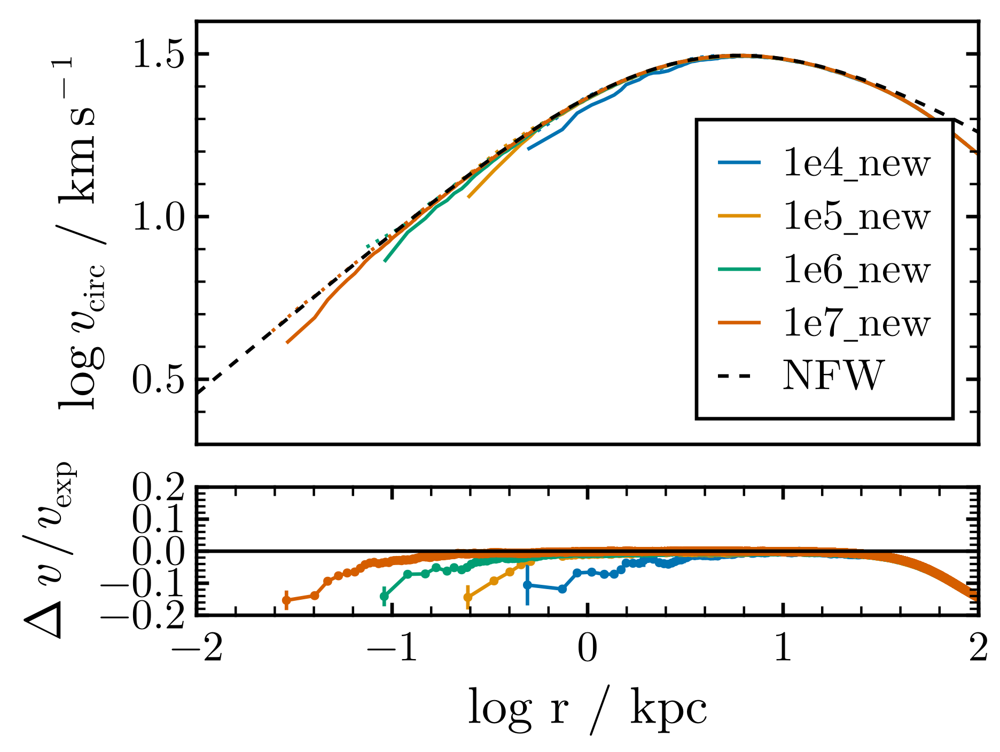

In [29]:
compare_vcirc(profiles, errskip=10)

In [30]:
profiles = load_dens_profiles(profnames)

OrderedDict{String, Vector{DensityProfile}} with 4 entries:
  "1e4_new" => [DensityProfile([-1.39687, -1.33713, -1.27739, -1.21765, -1.1579…
  "1e5_new" => [DensityProfile([-1.41616, -1.38838, -1.36061, -1.33284, -1.3050…
  "1e6_new" => [DensityProfile([-2.33269, -2.3198, -2.30691, -2.29402, -2.28112…
  "1e7_new" => [DensityProfile([-2.84079, -2.8348, -2.82882, -2.82283, -2.81684…

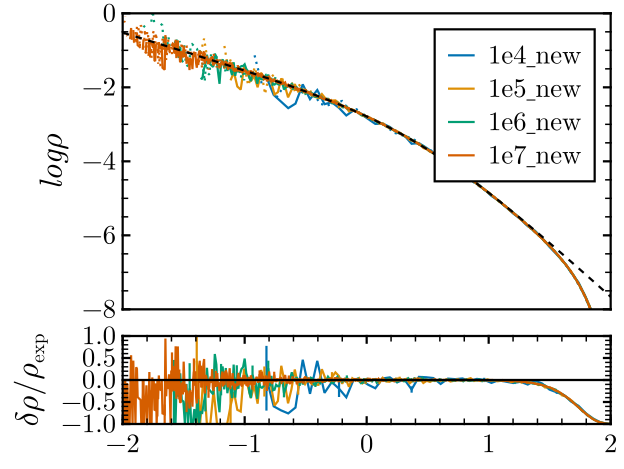

In [31]:
compare_densities(profiles,  errskip=10)

# 1e6

In [28]:
print_cpus_in_folder("1e6_new")

model   	cpu s/T0	%grav
--------	--------	--------
fiducial	  166.12	95.6
s0.014  	  222.58	94.0
s0.14   	  172.32	93.5
skipping template


## Softening

In [30]:
profnames = OrderedDict(
   # "1e4" => load_profile("1e4/fiducial"),
    "1e6_new" => "1e6_new/fiducial",
    "1e6" => "1e6/fiducial",
    "1e6_s0.14" => "1e6_new/s0.14",
    "1e6_s0.014" => "1e6_new/s0.014",
    )

OrderedDict{String, String} with 4 entries:
  "1e6_new"    => "1e6_new/fiducial"
  "1e6"        => "1e6/fiducial"
  "1e6_s0.14"  => "1e6_new/s0.14"
  "1e6_s0.014" => "1e6_new/s0.014"

In [31]:
profiles = load_profiles(profnames)

OrderedDict{String, Vector{MassProfile}} with 4 entries:
  "1e6_new"    => [MassProfile([0.0740282, 0.111672, 0.137336, 0.15765, 0.17909…
  "1e6"        => [MassProfile([0.102805, 0.146205, 0.176474, 0.204129, 0.22932…
  "1e6_s0.14"  => [MassProfile([0.0740282, 0.111672, 0.137336, 0.15765, 0.17909…
  "1e6_s0.014" => [MassProfile([0.0740282, 0.111672, 0.137336, 0.15765, 0.17909…

In [32]:
for (label, profs) in profiles
    Nvir = LilGuys.mean(profs[end].radii .< LilGuys.R200(halo))
    Nvir2 = LilGuys.mean(profs[end].radii .< 2LilGuys.R200(halo))
    println(label, "\t", round(Nvir, digits=3), "\t", round(Nvir2, digits=3))
end

1e6_new	0.853	0.994
1e6	0.523	0.688
1e6_s0.14	0.853	0.994
1e6_s0.014	0.853	0.994


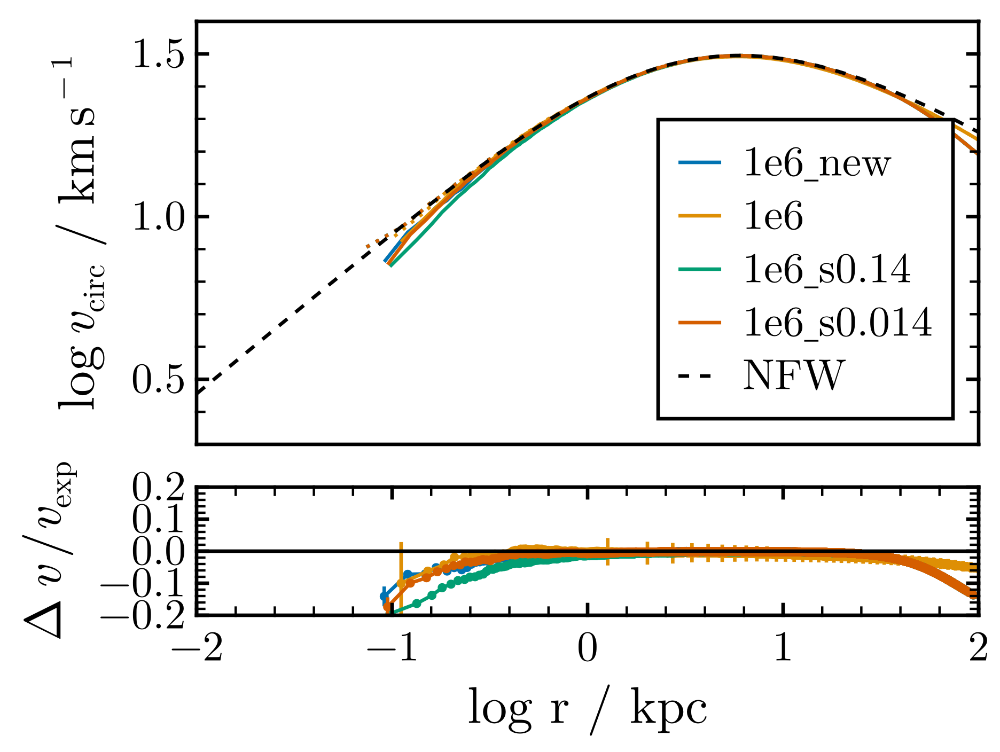

In [33]:
compare_vcirc(profiles, errskip=100)

In [34]:
profiles = load_dens_profiles(profnames)

OrderedDict{String, Vector{DensityProfile}} with 4 entries:
  "1e6_new"    => [DensityProfile([-2.33269, -2.3198, -2.30691, -2.29402, -2.28…
  "1e6"        => [DensityProfile([-2.24914, -2.23023, -2.21131, -2.1924, -2.17…
  "1e6_s0.14"  => [DensityProfile([-2.33269, -2.3198, -2.30691, -2.29402, -2.28…
  "1e6_s0.014" => [DensityProfile([-2.33269, -2.3198, -2.30691, -2.29402, -2.28…

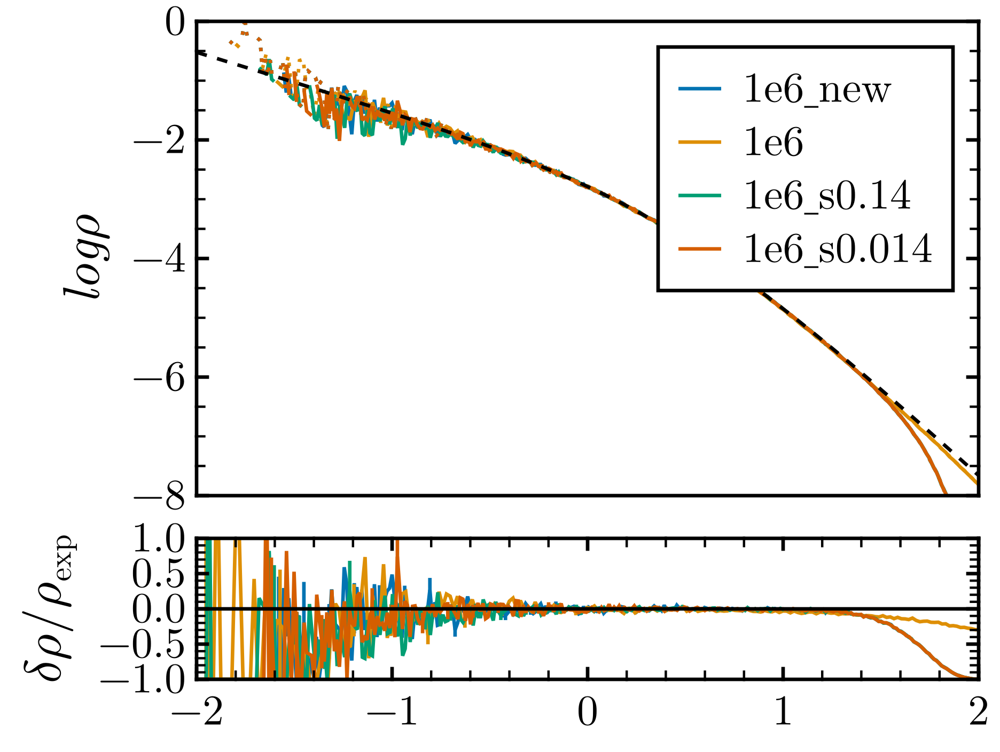

In [35]:
compare_densities(profiles,  errskip=10)

# 1e4

## NFW

In [278]:
 print_cpus_in_folder("1e4_new")

model    	cpu s/T0	%grav
---------	--------	--------
acc_0.003	    1.23	82.4
f_0.001  	    2.39	62.6
fiducial 	    1.24	80.6
s0.14    	    1.24	75.6
s1.4     	    1.36	84.8
skipping template


### Softening

In [279]:
profnames = OrderedDict(
   # "1e4" => load_profile("1e4/fiducial"),
    "1e4_new" => "1e4_new/fiducial",
    "1e4_s1.4" => "1e4_new/s1.4",
    "1e4_s0.14" => "1e4_new/s0.14",
    )

OrderedDict{String, String} with 3 entries:
  "1e4_new"   => "1e4_new/fiducial"
  "1e4_s1.4"  => "1e4_new/s1.4"
  "1e4_s0.14" => "1e4_new/s0.14"

In [280]:
profiles = load_profiles(profnames)

OrderedDict{String, Vector{MassProfile}} with 3 entries:
  "1e4_new"   => [MassProfile([0.448704, 0.660068, 0.81394, 0.959825, 1.10051, …
  "1e4_s1.4"  => [MassProfile([0.448704, 0.660068, 0.81394, 0.959825, 1.10051, …
  "1e4_s0.14" => [MassProfile([0.448704, 0.660068, 0.81394, 0.959825, 1.10051, …

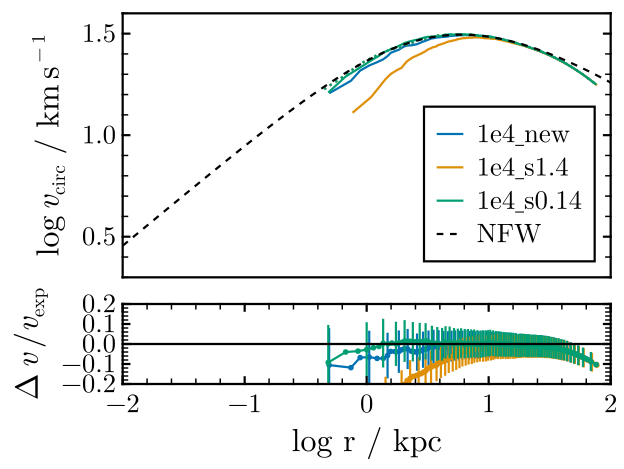

In [281]:
compare_vcirc(profiles, errskip=3)

In [283]:
profiles = load_dens_profiles(profnames)

OrderedDict{String, Vector{DensityProfile}} with 3 entries:
  "1e4_new"   => [DensityProfile([-1.39687, -1.33713, -1.27739, -1.21765, -1.15…
  "1e4_s1.4"  => [DensityProfile([-1.39687, -1.33713, -1.27739, -1.21765, -1.15…
  "1e4_s0.14" => [DensityProfile([-1.39687, -1.33713, -1.27739, -1.21765, -1.15…

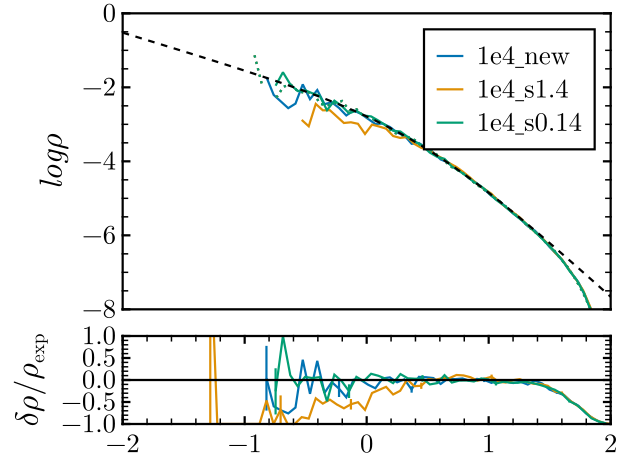

In [284]:
compare_densities(profiles,  errskip=10)

In [288]:
profnames = OrderedDict(
   # "1e4" => load_profile("1e4/fiducial"),
    "1e4_new" => "1e4_new/fiducial",
    "1e4_f" => "1e4_new/f_0.001",
    "1e4_t" => "1e4_new/acc_0.003",
    
    )

OrderedDict{String, String} with 3 entries:
  "1e4_new" => "1e4_new/fiducial"
  "1e4_f"   => "1e4_new/f_0.001"
  "1e4_t"   => "1e4_new/acc_0.003"

In [44]:
profiles = load_profiles(profnames)

OrderedDict{String, Vector{MassProfile}} with 2 entries:
  "1e6_new"   => [MassProfile([0.0740282, 0.111672, 0.137336, 0.15765, 0.179094…
  "1e6_s0.14" => [MassProfile([0.0740282, 0.111672, 0.137336, 0.15765, 0.179094…

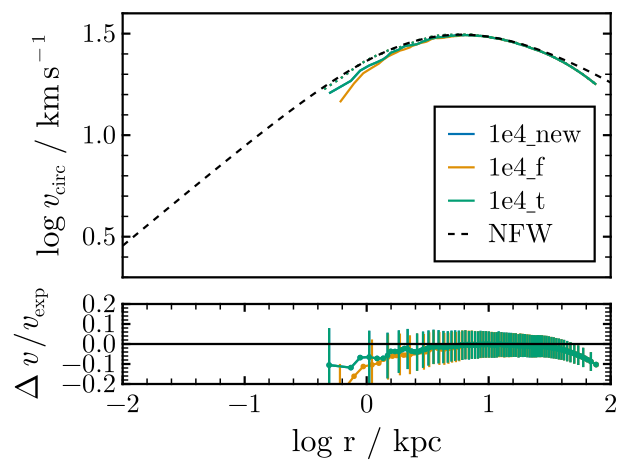

In [290]:
compare_vcirc(profiles, errskip=3)

In [292]:
profiles = load_dens_profiles(profnames)

OrderedDict{String, Vector{DensityProfile}} with 3 entries:
  "1e4_new" => [DensityProfile([-1.39687, -1.33713, -1.27739, -1.21765, -1.1579…
  "1e4_f"   => [DensityProfile([-1.39687, -1.33713, -1.27739, -1.21765, -1.1579…
  "1e4_t"   => [DensityProfile([-1.39687, -1.33713, -1.27739, -1.21765, -1.1579…

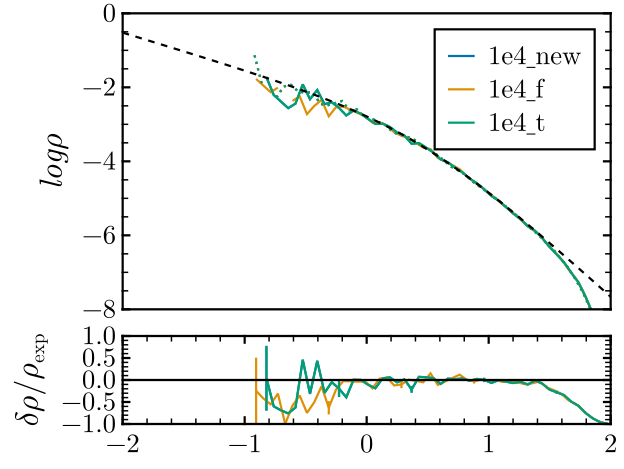

In [293]:
compare_densities(profiles,  errskip=10)

# 1e5

In [28]:
print_cpus_in_folder("1e5_new")

model    	cpu s/T0	%grav
---------	--------	--------
acc_0.003	   14.42	94.6
acc_0.02 	   13.06	94.6
acc_0.03 	   13.07	94.7
f_0.001  	   25.03	97.3
f_0.02   	    9.88	92.2
fiducial 	   13.06	94.7
s0.044   	   14.32	94.8
s0.44    	   13.88	95.3
skipping template


### Timestep accuracy

In [29]:
profnames = OrderedDict(
    "0.003" => "1e5_new/fiducial",
    "0.01" => "1e5_new/acc_0.003",
    "0.03" => "1e5_new/acc_0.03",
    )

OrderedDict{String, String} with 3 entries:
  "0.003" => "1e5_new/fiducial"
  "0.01"  => "1e5_new/acc_0.003"
  "0.03"  => "1e5_new/acc_0.03"

In [30]:
profiles = load_profiles(profnames)

OrderedDict{String, Vector{MassProfile}} with 3 entries:
  "0.003" => [MassProfile([0.206673, 0.295749, 0.36353, 0.429639, 0.484206, 0.5…
  "0.01"  => [MassProfile([0.206673, 0.295749, 0.36353, 0.429639, 0.484206, 0.5…
  "0.03"  => [MassProfile([0.206673, 0.295749, 0.36353, 0.429639, 0.484206, 0.5…

In [31]:
compare_vcirc(profiles, errskip=1)

In [32]:
profiles = load_dens_profiles(profnames)

OrderedDict{String, Vector{DensityProfile}} with 3 entries:
  "0.003" => [DensityProfile([-1.41616, -1.38838, -1.36061, -1.33284, -1.30507,…
  "0.01"  => [DensityProfile([-1.41616, -1.38838, -1.36061, -1.33284, -1.30507,…
  "0.03"  => [DensityProfile([-1.41616, -1.38838, -1.36061, -1.33284, -1.30507,…

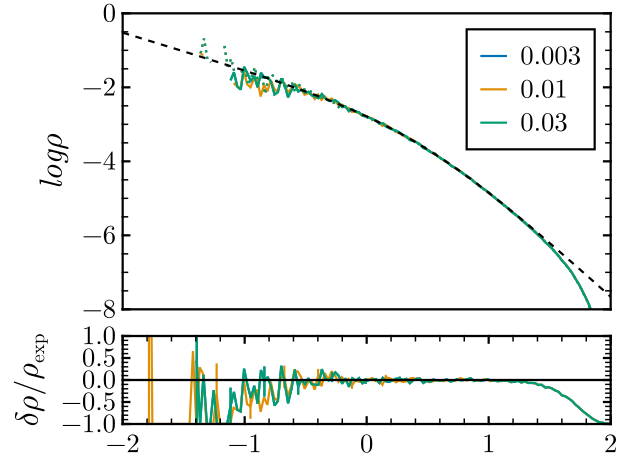

In [33]:
compare_densities(profiles,  errskip=10)

### Force accuracy

In [40]:
profnames = OrderedDict(
    "0.005" => "1e5_new/fiducial",
    "0.001" => "1e5_new/f_0.001",
    "0.02" => "1e5_new/f_0.02",
    )

OrderedDict{String, String} with 3 entries:
  "0.005" => "1e5_new/fiducial"
  "0.001" => "1e5_new/f_0.001"
  "0.02"  => "1e5_new/f_0.02"

In [41]:
profiles = load_profiles(profnames)

OrderedDict{String, Vector{MassProfile}} with 3 entries:
  "0.005" => [MassProfile([0.206673, 0.295749, 0.36353, 0.429639, 0.484206, 0.5…
  "0.001" => [MassProfile([0.206673, 0.295749, 0.36353, 0.429639, 0.484206, 0.5…
  "0.02"  => [MassProfile([0.206673, 0.295749, 0.36353, 0.429639, 0.484206, 0.5…

In [42]:
compare_vcirc(profiles, errskip=1)

In [43]:
profiles = load_dens_profiles(profnames)

OrderedDict{String, Vector{DensityProfile}} with 3 entries:
  "0.005" => [DensityProfile([-1.41616, -1.38838, -1.36061, -1.33284, -1.30507,…
  "0.001" => [DensityProfile([-1.41616, -1.38838, -1.36061, -1.33284, -1.30507,…
  "0.02"  => [DensityProfile([-1.41616, -1.38838, -1.36061, -1.33284, -1.30507,…

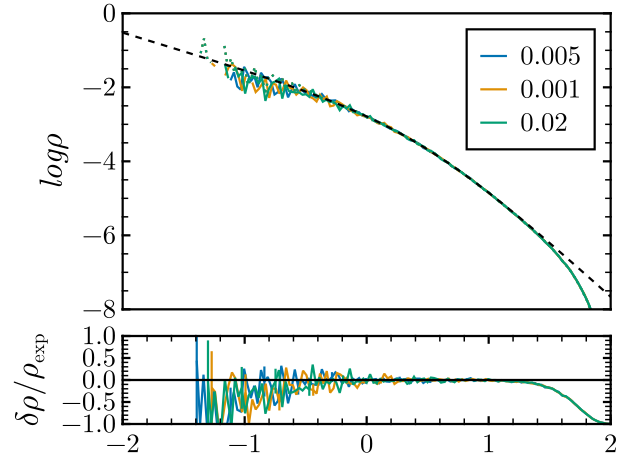

In [44]:
compare_densities(profiles,  errskip=10)

### Softening

In [45]:
profnames = OrderedDict(
    "s0.44" => "1e5_new/s0.44",

    "1e5_new" => "1e5_new/fiducial",
    "s0.044" => "1e5_new/s0.044",
    )

OrderedDict{String, String} with 3 entries:
  "s0.44"   => "1e5_new/s0.44"
  "1e5_new" => "1e5_new/fiducial"
  "s0.044"  => "1e5_new/s0.044"

In [46]:
profiles = load_dens_profiles(profnames)

OrderedDict{String, Vector{DensityProfile}} with 3 entries:
  "s0.44"   => [DensityProfile([-1.41616, -1.38838, -1.36061, -1.33284, -1.3050…
  "1e5_new" => [DensityProfile([-1.41616, -1.38838, -1.36061, -1.33284, -1.3050…
  "s0.044"  => [DensityProfile([-1.41616, -1.38838, -1.36061, -1.33284, -1.3050…

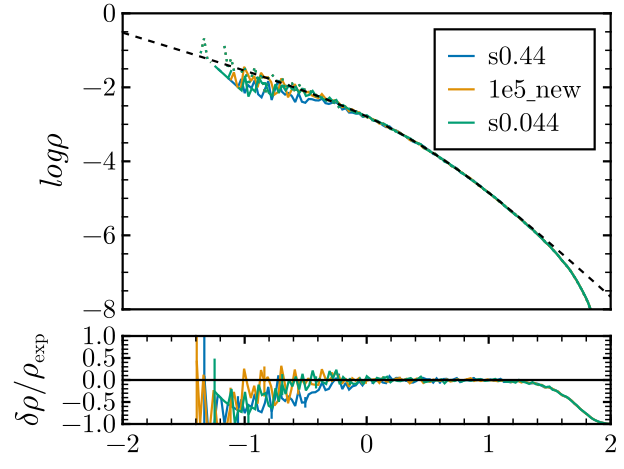

In [47]:
compare_densities(profiles,  errskip=10)

In [48]:
profiles = load_profiles(profnames)

OrderedDict{String, Vector{MassProfile}} with 3 entries:
  "s0.44"   => [MassProfile([0.206673, 0.295749, 0.36353, 0.429639, 0.484206, 0…
  "1e5_new" => [MassProfile([0.206673, 0.295749, 0.36353, 0.429639, 0.484206, 0…
  "s0.044"  => [MassProfile([0.206673, 0.295749, 0.36353, 0.429639, 0.484206, 0…

In [49]:
compare_vcirc(profiles, errskip=1)

## 1e5 cored

In [29]:
print_cpus_in_folder("1e5_c1")

model   	cpu s/T0	%grav
--------	--------	--------
fiducial	    8.88	95.8
s_0.044 	    9.48	95.3
skipping template


### Timestep accuracy

In [35]:
profnames = OrderedDict(
    "0.14" => "1e5_c1/fiducial",
    "0.044" => "1e5_c1/s_0.044",
    )

OrderedDict{String, String} with 2 entries:
  "0.14"  => "1e5_c1/fiducial"
  "0.044" => "1e5_c1/s_0.044"

In [42]:
halo_cored = LilGuys.CoredNFW(M_s = 0.340, r_s = 1.38, r_c = 1.38, r_t = 27.6, xi = 3)


LilGuys.CoredNFW(0.34, 1.38, 1.38, 27.6, 3.0, 26.266684063204657)

In [37]:
profiles = load_profiles(profnames)

OrderedDict{String, Vector{MassProfile}} with 2 entries:
  "0.14"  => [MassProfile([0.287139, 0.378672, 0.441795, 0.500529, 0.551076, 0.…
  "0.044" => [MassProfile([0.287139, 0.378672, 0.441795, 0.500529, 0.551076, 0.…

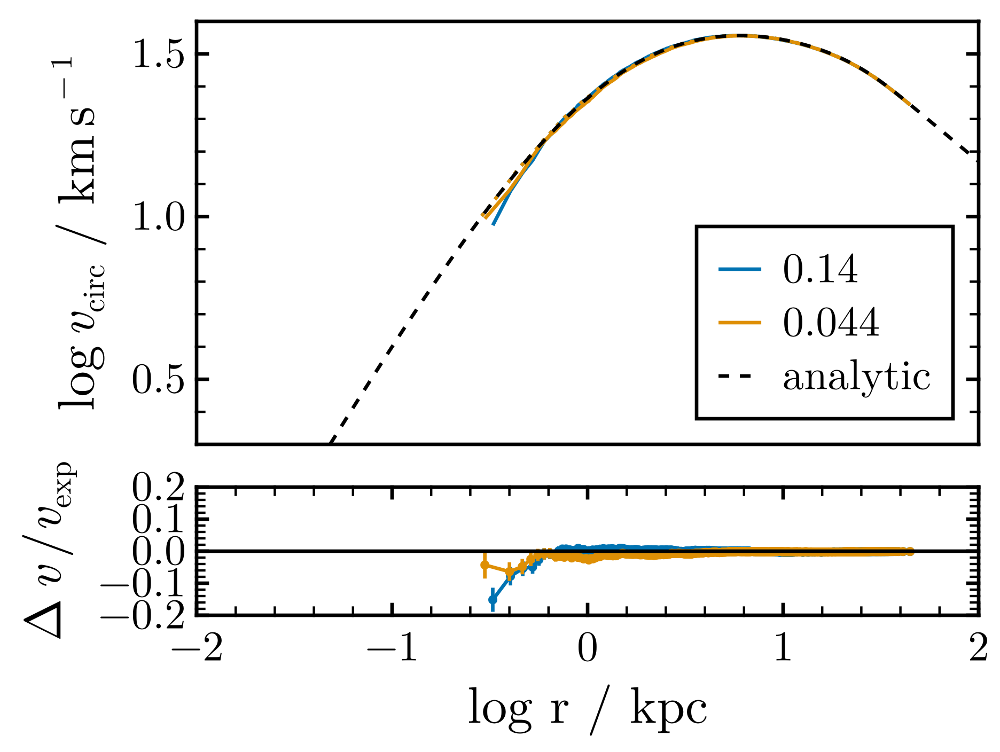

In [43]:
compare_vcirc(profiles, errskip=1, halo=halo_cored)

# 1e6

# 1e7

# Particle Number

In [ ]:
profiles = [
    "1e4" => load_profile("1e4/fiducial"),
    "1e5" => load_profile("1e5/fiducial"),
     "1e6" => load_profile("1e6/fiducial"),
    "1e7" => load_profile("1e7/fiducial")
    ];

In [ ]:
compare_densities(profiles,  errskip=10)

In [ ]:
compare_vcirc(profiles, errskip=1)

In [ ]:
compare_t_dyn(profiles)

## Cores

In [ ]:
? LilGuys.scale

In [ ]:
prof = load_profile("1e6_c0.1/fiducial")

m_scale = 0.29/0.3
r_scale = 2.76/1.9
v_scale = sqrt(m_scale/r_scale)

for p in prof
    p.v_circ .*= v_scale
    p.v_circ_err .*= v_scale
    p.r_circ .*= r_scale
    p.rho .*= m_scale / r_scale^3
    p.rho_err .*= m_scale / r_scale^3
    p.log_r .+= log10(r_scale)
    p.log_r_bins .+= log10(r_scale)
end
    

In [ ]:
propertynames(prof[1])

In [ ]:
profiles = [
    "1e4" => load_profile("1e4/fiducial"),
    "1e5" => load_profile("1e5/fiducial"),
     "1e6" => load_profile("1e6/fiducial"),
     "1e6c" => prof,
    "1e7" => load_profile("1e7/fiducial"),
    ];

In [ ]:
compare_densities(profiles,  errskip=10)

In [ ]:
compare_vcirc(profiles, errskip=1)

In [ ]:
h_nfw = LilGuys.TruncNFW(M_s=0.29, r_s=2.76, trunc=100)
h_core = LilGuys.CoredNFW(M_s=0.3, r_s=1.9, r_c=0.19, r_t=190)

In [ ]:
fig = Figure()
ax = Axis(fig[1,1])

x = LinRange(-2, 3, 1000)
r = 10 .^ x
y = @. log10(v_circ(h_nfw, r))
lines!(x, y)

y = @. log10(v_circ(h_core, r))
lines!(x .+ log10(r_scale), y .+ log10(v_scale))
fig

In [ ]:
fig = Figure()
ax = Axis(fig[1,1])

x = LinRange(-2, 3, 1000)
r = 10 .^ x
y = @. log10(calc_ρ(h_nfw, r))
lines!(x, y)

y = @. log10(calc_ρ(h_core, r))
lines!(x .+ log10(r_scale), y .+ log10(m_scale/r_scale^3))
fig

In [ ]:
compare_t_dyn(profiles)

## 1e4

In [ ]:
print_cpus_in_folder("../sculptor/1e4_V31_r3.2")

In [ ]:
print_cpus_in_folder("1e4")

In [ ]:
profiles = [
    "1e4" => load_profile("1e4/fiducial"),
    "gadget2" => load_profile("1e4/gadget2"),
    ];

In [ ]:
compare_vcirc(profiles, errskip=1)

In [ ]:
model_names = ["isolation/"] .* [
    "1e4/s0.014",
    "1e4/s0.44",
    "1e4/default",
    "1e4/s4"
    ]

labels = [
    "0.014",
    "0.44",
    "1.4",
    "4"
    ]

profiles = load_profile.(model_names);

In [ ]:
compare_densities(profiles, labels)

In [ ]:
model_names = ["isolation/"] .* [
    "1e4/dt_0.01",
    "1e4/dt_1",
    "1e4/dt_10",
    "1e4/default",
    ]

labels = model_names
profiles = load_profile.(model_names);

In [ ]:
compare_densities(profiles, labels)

In [ ]:
model_names = ["isolation/"] .* [
    "1e4/dt_0.01",
    "1e4/acc_0.001",
    "1e4/acc_0.003",
    "1e4/default",
    "1e4/acc_0.1",
    ]

labels = model_names
profiles = load_profile.(model_names);

In [ ]:
compare_densities(profiles, labels)

The above figure compares models using different relative timestepping criteria. The models perfectly converge around a parameter eta=0.003

### Gravitational force accuracy

In [ ]:
model_names = ["isolation/"] .* [
    "1e4/theta_0.1",
    "1e4/default",
    "1e4/theta_1",
    ]

labels = model_names
profiles = load_profile.(model_names);

In [ ]:
compare_densities(profiles, labels)

In [ ]:
model_names = ["isolation/"] .* [
    "1e4/theta_0.01",
    "1e4/theta_0.1",
    "1e4/default",
    "1e4/thetarel_0.5",
    ]

labels = model_names
profiles = load_profile.(model_names);

In [ ]:
compare_densities(profiles, labels)

The models above compare different values of the gravitational opening criterion. Below a theta of 0.1, the models are perfectly converged here. 

### Gravity methods

In [ ]:
model_names = ["isolation/1e4/"] .* [
    "dt_0.3",
    "treepm",
    "fmm",
    ]

labels = model_names
profiles = load_profile.(model_names);

In [ ]:
compare_densities(profiles, labels)

## 1e5

In [ ]:
print_cpus_in_folder("1e5")

cpu_all = 531.4 # first value of last row in cpus.txt. Should be ~ wall time.
n_cpus = 4 # these two can be read off second to last row.
t_end = 117

println("gadget2\t\t    ", round(cpu_all * n_cpus / t_end, digits=2)) # gadget 2, don't have neat way to read in 


cpu_all = 89.82 # first value of last row in cpus.txt. Should be ~ wall time.
n_cpus = 4 # these two can be read off second to last row.
t_end = 117

println("gadget2 (relative)   ", round(cpu_all * n_cpus / t_end, digits=2)) # gadget 2, don't have neat way to read in 

    

In [ ]:
profiles = [
    "gadget4" => load_profile("1e5/gadget4"),
    "gadget2" => load_profile("1e5/gadget2"),
    "gadget2_relopen" => load_profile("1e5/gadget2_relopen"),
    "gadget4_relopen" => load_profile("1e5/gadget4_relopen"),

    ];

In [ ]:
compare_vcirc(profiles, errskip=1, xlims=(-1, 3), vlims=(0.7, 1.55))

In [ ]:
model_names = ["isolation/1e5/"] .* [
    "s1.4",
    "s0.44",
    "default",
   #"fiducial",
    "s0.044",
    "s0.014",
    ]

labels = model_names
profiles = load_profile.(model_names);

In [ ]:
compare_densities(profiles, labels)

In [ ]:
model_names = ["isolation/1e5/"] .* [
    "facc_0.015",
    "f",
   #"fiducial",
    "facc_0.001",
    ]

labels = model_names
profiles = load_profile.(model_names);

In [ ]:
compare_densities(profiles, labels)

## 1e6

In [ ]:
print_cpus_in_folder("1e6")

cpu_all = 524.42 # first value of last row in cpus.txt. Should be ~ wall time.
n_cpus = 80 # these two can be read off second to last (or last header) row.
t_end = 117

println("gadget2 (rel)\t  ", round(cpu_all * n_cpus / t_end, digits=2)) # gadget 2, don't have neat way to read in 


In [ ]:
profiles = [
    "s=0.014 kpc" => load_profile("1e6/s0.014"),
    "s=0.044 kpc" => load_profile("1e6/fiducial")[1:6],
    #"s=0.14 kpc" => load_profile("1e6/s0.14"),
    "gadget2 (s=0.044)" => load_profile("1e6/gadget2")[1:6],
    ];

In [ ]:
for (name, prof) in profiles
    println(name, "\t", prof[end].time)
end

In [ ]:
compare_densities(profiles)

In [ ]:
compare_vcirc(profiles, errskip=10)

In [ ]:
compare_t_dyn(profiles)

## Halo generation methods

In [ ]:
profiles = [
    "agama" => load_profile("isolation/1e6/fiducial"),
    "gspmodel" => load_profile("isolation/1e6_gspmodel"),
    "gsp_realize" => load_profile("isolation/1e6_gsprealize"),
    ]

In [ ]:
compare_densities(profiles)

In [ ]:
compare_vcirc(profiles, labels)

In [ ]:
compare_vcirc1(profiles[1][end], res_limits=0.03)

In [ ]:
compare_vcirc1(profiles[2][end], NFWZeno(m_a=halo.M_s * LilGuys.A_NFW(1), a=halo.r_s, b=halo.r_s * 2))

In [ ]:
compare_vcirc1(profiles[3][end], NFWZeno(m_a=halo.M_s * LilGuys.A_NFW(1), a=halo.r_s, b=halo.r_s * 64), res_limits=0.03)

# 1e7

In [36]:
print_cpus_in_folder("1e7")

model   	cpu s/T0	%grav
--------	--------	--------
fiducial	 3712.86	91.6
s0.044  	 2482.67	91.6
skipping template


In [39]:
profiles = [
    "s=0.014 (default)" => load_profile("1e7/fiducial"),
    "s=0.044" => load_profile("1e7/s0.044")
    ];

LoadError: UndefKeywordError: keyword argument `M_in` not assigned

In [ ]:
compare_densities(profiles,  errskip=10)

In [ ]:
compare_vcirc(profiles, errskip=10)

In [ ]:
compare_t_dyn(profiles)

In [ ]:
plot(profiles[1].second[end].log_r, log10.(cumsum(profiles[1].second[end].counts)))

# Exponential

In [31]:
print_cpus_in_folder("1e4_exp")

model   	cpu s/T0	%grav
--------	--------	--------
fiducial	    1.06	88.4
s_0.002 	    1.87	89.6
s_0.02  	    0.60	91.1
skipping template


In [26]:
profnames = OrderedDict(
   # "1e4" => load_profile("1e4/fiducial"),
    "1e4" => "1e4_exp/fiducial",
    "s0.02" => "1e4_exp/s_0.02",
    "s0.002" => "1e4_exp/s_0.002",
    )


OrderedDict{String, String} with 3 entries:
  "1e4"    => "1e4_exp/fiducial"
  "s0.02"  => "1e4_exp/s_0.02"
  "s0.002" => "1e4_exp/s_0.002"

In [32]:
halo_exp = LilGuys.Exp2D(M=3e-4, R_s=0.10)

LilGuys.Exp2D{Float64}(0.0003, 0.1)

In [27]:
profiles = load_profiles(profnames)

OrderedDict{String, Vector{MassProfile}} with 3 entries:
  "1e4"    => [MassProfile([0.0224913, 0.0310438, 0.0375464, 0.0422299, 0.04698…
  "s0.02"  => [MassProfile([0.0224913, 0.0310438, 0.0375464, 0.0422299, 0.04698…
  "s0.002" => [MassProfile([0.0224913, 0.0310438, 0.0375464, 0.0422299, 0.04698…

In [48]:
r_max = 0.26902166206220623

0.26902166206220623

In [52]:
let
    x =  LinRange(0.2690216620622059, 0.269021662062206, 10000)
    y = LilGuys.v_circ.(halo_exp, x)
    @info x[argmax(y)]
end

[ Info: 0.26902166206220596


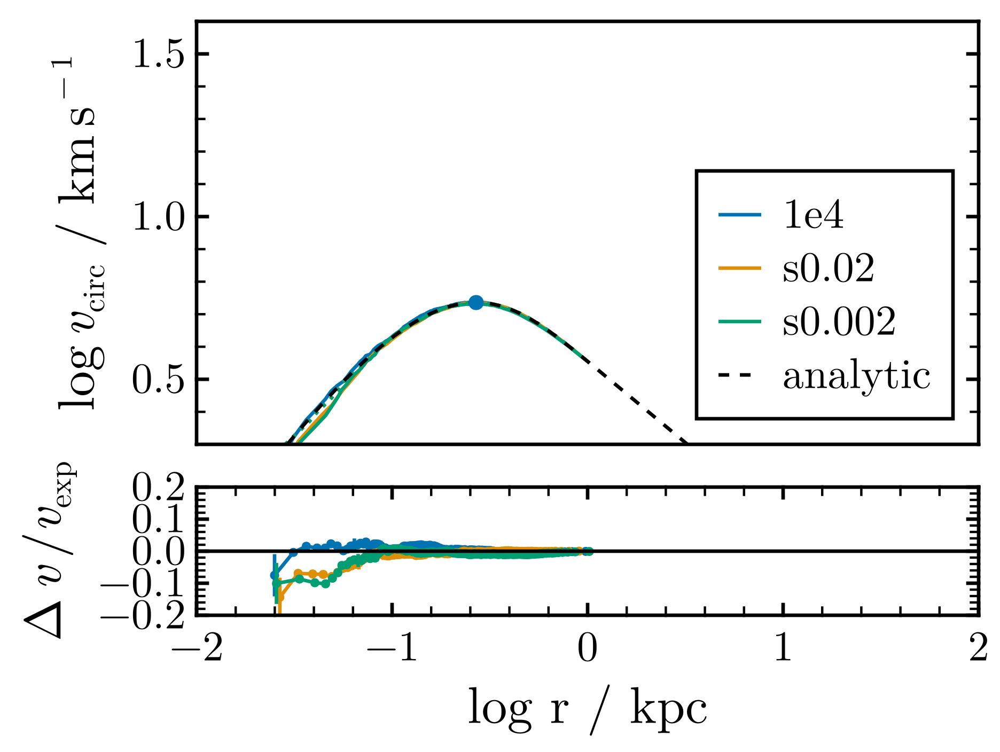

In [54]:
let 
    fig = compare_vcirc(profiles, errskip=10, halo=halo_exp)

    scatter!(fig.content[1], log10(r_max), log10(LilGuys.v_circ(halo_exp, r_max)*V2KMS))
    fig
end
    